# Geographical Analysis

There are a variety of approaches for plotting large datasets, but most of them are very unsatisfactory. Here we first show some of the issues, then demonstrate how Datashader helps make large datasets truly practical.  

We'll use part of the well-studied [NYC Taxi trip database](https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page), with the locations of all NYC taxi pickups and dropoffs from the month of January 2015.  Although we know what the data is, let's approach it as if we are doing data mining, and see what it takes to understand the dataset from scratch.

**NOTE:**  This dataset is also explorable through the Datashader example [dashboard](dashboard.ipynb).

## Load NYC Taxi data 

These data have been transformed from the original database to a [parquet file](https://parquet.apache.org/docs/). It should take about 5 seconds to load (compared to 10-20 seconds when stored in the inefficient CSV file format).

In [1]:
import dask.dataframe as dd

usecols = ['dropoff_x', 'dropoff_y', 'pickup_x', 'pickup_y', 'dropoff_hour', 'pickup_hour', 'passenger_count']

In [2]:
%%time
df = dd.read_parquet('data/nyc_taxi_wide.parq', engine='fastparquet')[usecols].persist()

print(len(df))

11842094
CPU times: user 311 ms, sys: 160 ms, total: 471 ms
Wall time: 470 ms


As you can see, this file contains about 12 million pickup and dropoff locations (in Web Mercator coordinates), with passenger counts.

In [3]:
df.tail()

,dropoff_x,dropoff_y,pickup_x,pickup_y,dropoff_hour,pickup_hour,passenger_count
11842089,-8232492.0,4979234.5,-8232297.5,4980859.5,19,19,2
11842090,-8234856.5,4971131.0,-8235721.0,4972331.0,19,19,2
11842091,-8234202.5,4981092.5,-8235340.5,4975470.0,19,19,1
11842092,-8235618.5,4973722.0,-8237594.0,4973844.0,19,19,1
11842093,-8234151.5,4977120.0,-8233228.5,4977946.5,19,19,1


## 1000-point scatterplot: undersampling

Any plotting program should be able to handle a plot of 1000 datapoints.  Here the points are initially overplotting each other, but if you hit the Reset button (toolbars at the top right of plot) to zoom in a bit, nearly all of them should be clearly visible in the following Bokeh plot of a random 1000-point sample.  If you know what to look for, you can even see the outline of Manhattan Island and Central Park from the pattern of dots.  We've included geographic map data here to help get you situated, though for a genuine data mining task in an abstract data space you might not have any such landmarks.  In any case, because this plot is discarding 99.99% of the data, it reveals very little of what might be contained in the dataset, a problem called *undersampling*.

In [4]:
import numpy as np
import hvplot.dask # noqa
import holoviews as hv
from holoviews import opts

In [5]:
plot_width  = int(750)
plot_height = int(plot_width//1.2)
x_range, y_range =(-8242000,-8210000), (4965000,4990000)

In [6]:
opts.defaults(
    opts.Points(width=plot_width, height=plot_height, size=5, color='blue'),
    opts.Overlay(width=plot_width, height=plot_height, xaxis=None, yaxis=None),
    opts.RGB(width=plot_width, height=plot_height),
    opts.Histogram(responsive=True, min_height=250))

In [7]:
samples = df.sample(frac=1e-4)
samples.hvplot.points('dropoff_x', 'dropoff_y', tiles='EsriStreet')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [dropoff_x,dropoff_y]

## 10,000-point scatterplot: overplotting

We can of course plot more points to reduce the amount of undersampling.  However, even if we only try to plot 0.1% of the data, ignoring the other 99.9%, we will find major problems with *overplotting*, such that the true density of dropoffs in central Manhattan is impossible to see due to occlusion:

In [8]:
df.sample(frac=1e-3).hvplot.points('dropoff_x', 'dropoff_y', tiles='EsriStreet')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [dropoff_x,dropoff_y]

Overplotting is reduced if you zoom in on a particular region. However, then the problem switches to back to serious undersampling, as the too-sparsely sampled datapoints get revealed for zoomed-in regions, even though much more data is available.

## 100,000-point scatterplot: saturation

If you make the dot size smaller, you can reduce the overplotting that occurs when you try to combat undersampling.  Even so, with enough opaque data points, overplotting will be unavoidable in popular dropoff locations.  So you can then adjust the alpha (opacity) parameter of most plotting programs, so that multiple points need to overlap before full color saturation is achieved.  With enough data, such a plot can approximate the probability density function for dropoffs, showing where dropoffs were most common:

In [9]:
df.sample(frac=1e-2).hvplot.points('dropoff_x', 'dropoff_y', tiles='EsriStreet', alpha=0.1, size=1)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [dropoff_x,dropoff_y]

However, it's very tricky to set the size and alpha parameters.  How do we know if certain regions are saturating, unable to show peaks in dropoff density? Here we've manually set the alpha to show a clear structure of streets and blocks, as one would intuitively expect to see, but the density of dropoffs still seems approximately the same on nearly all Manhattan streets (just wider in some locations), which is unlikely to be true. We can of course reduce the alpha value to reduce saturation further, but there's no way to tell when it's been set correctly, and it's already low enough that nothing other than Manhattan and La Guardia is showing up at all. Plus, this alpha value will only work even reasonably well at the one zoom level shown. Try zooming in to see that at higher zooms, there is less overlap between dropoff locations, so that the points *all* start to become transparent due to lack of overlap. Yet without setting the size and alpha to a low value in the first place, the stucture is invisible when zoomed out, due to overplotting. Thus even though Bokeh provides rich support for interactively revealing structure by zooming, it is of limited utility for large data; either the data is invisible when zoomed in, or there's no large-scale structure when zoomed out, which is necessary to indicate where zooming would be informative.

Moreover, we're still ignoring 99% of the data.  Many plotting programs will have trouble with plots even this large, but Bokeh can handle 100-200,000 points in most browsers. Here Bokeh's WebGL support is enabled by default, which gives smoother zooming behavior, but the non-WebGL mode also works well. Still, for such large sizes the plots become slow due to the large HTML file sizes involved, because each of the data points are encoded as text in the web page, and for even larger samples the browser will fail to render the page at all.

## 10-million-point datashaded plots: auto-ranging, but limited dynamic range

To let us work with truly large datasets without discarding most of the data, we can take an entirely different approach. Instead of using a Bokeh scatterplot, which encodes every point into JSON and stores it in the HTML file read by the browser, we can use the [datashader](https://datashader.org) library to render the entire dataset into a pixel buffer in a separate Python process, and then provide a fixed-size image to the browser containing only the data currently visible. This approach decouples the data processing from the visualization.  The data processing is then limited only by the computational power available, while the visualization has much more stringent constraints determined by your display device (a web browser and your particular monitor, in this case). This approach works particularly well when your data is in a far-off server, but it is also useful whenever your dataset is larger than your display device can render easily.

Because the number of points involved is no longer a limiting factor, you can now use the entire dataset (including the full 150 million trips that have been made public, if you download that data separately).  Most importantly, because datashader allows computation on the intermediate stages of plotting, you can easily define operations like auto-ranging (which is on by default), so that we can be sure there is no overplotting or saturation and no need to set parameters like alpha.

The steps involved in raw datashading are:
1. Create a Canvas object with the shape of the eventual plot (i.e. having one storage bin for collecting points, per final pixel)
2. Aggregate all points into that set of bins, incrementally counting them
3. Map the resulting counts into a visible color from a specified range to make an image:

In [10]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Greys9
Greys9_r = list(reversed(Greys9))[:-2]

In [11]:
%%time
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)
agg = cvs.points(df, 'dropoff_x', 'dropoff_y')
img = tf.shade(agg, cmap=['skyblue', 'blue'], how='linear')

CPU times: user 520 ms, sys: 104 ms, total: 624 ms
Wall time: 627 ms


The resulting image is similar to the 100,000-point Bokeh plot above, but (a) makes use of all 12 million datapoints, (b) is computed in only a tiny fraction of the time, (c) does not require any magic-number parameters like size and alpha, and (d) automatically ensures that there is no saturation or overplotting:

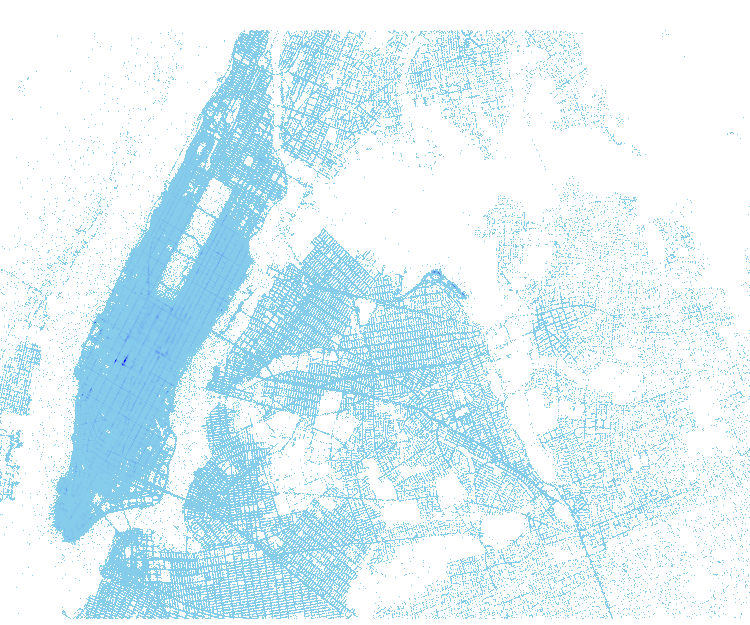

In [12]:
img

This plot renders the count at every pixel as a color from the specified range (here from sky blue to blue), mapped linearly. If your display device were perceptually linear, and the data were distributed evenly across this color range, then the result of such linear, auto-ranged processing would be an effective, parameter-free way to visualize your dataset.

However, even if you have a display device calibrated to be perceptually linear, real data is rarely distributed evenly.  Here, it is clear that there are "hotspots" in dropoffs, with a very high count for areas around Penn Station and Madison Square Garden, relatively low counts for the rest of Manhattan's streets, and nearly no dropoffs anywhere else but La Guardia airport.  NYC taxis definitely cover a larger geographic range than this, so what is the problem?  To see, let's look at the histogram of counts per pixel for the above image:

In [13]:
frequencies,edges = np.histogram(agg.values, bins=100)
hv.Histogram((edges, frequencies)).redim.range(Frequency=(0,6000))

:Histogram   [x]   (Frequency)

Clearly, most of the pixels have very low counts (under 3000), while a very few pixels have much larger counts (up to 22000, in this case).  When these values are mapped into colors for display, nearly all of the pixels will end up being colored with the lowest colors in the range, i.e. sky blue, while the other colors in the available range will be used for only a few dozen pixels at most.  Thus most of the pixels in this plot convey very little information about the data, wasting nearly all of dynamic range available on your display device.  It's thus very likely that we are missing a lot of the structure in this data that we could be seeing.


## 10-million-point datashaded plots: high dynamic range

For the typical case of data that is distributed nonlinearly over the available range, we can use nonlinear scaling to map the data range into the visible color range.  E.g. first transforming the values via a log function will help flatten out this histogram and reveal much more of the structure of this data:

In [14]:
frequencies,edges = np.histogram(np.log1p(agg.values), bins=100)
hv.Histogram((edges, frequencies)).redim.range(Frequency=(0,8000))

:Histogram   [x]   (Frequency)

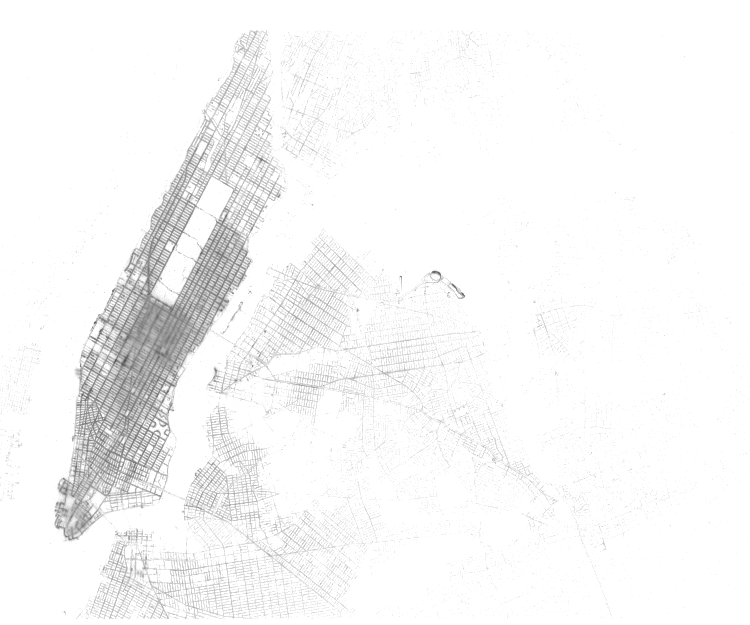

In [15]:
tf.shade(agg, cmap=Greys9_r, how='log')

We can now see that there is rich structure throughout this dataset -- geographic features like streets and buildings are clearly modulating the values in both the high-dropoff regions in Manhattan and the relatively low-dropoff regions in the surrounding areas.  Still, this choice is arbitrary -- why the log function in particular?  It clearly flattened the histogram somewhat, but it was just a guess.  We can instead explicitly equalize the histogram of the data before building the image, making structure visible at every data level (and thus at all the geographic locations covered) in a general way:

In [16]:
frequencies,edges = np.histogram(tf.eq_hist(agg.values)[0], bins=100)
hv.Histogram((edges, frequencies)).redim.range(Frequency=(0,6000))

:Histogram   [x]   (Frequency)

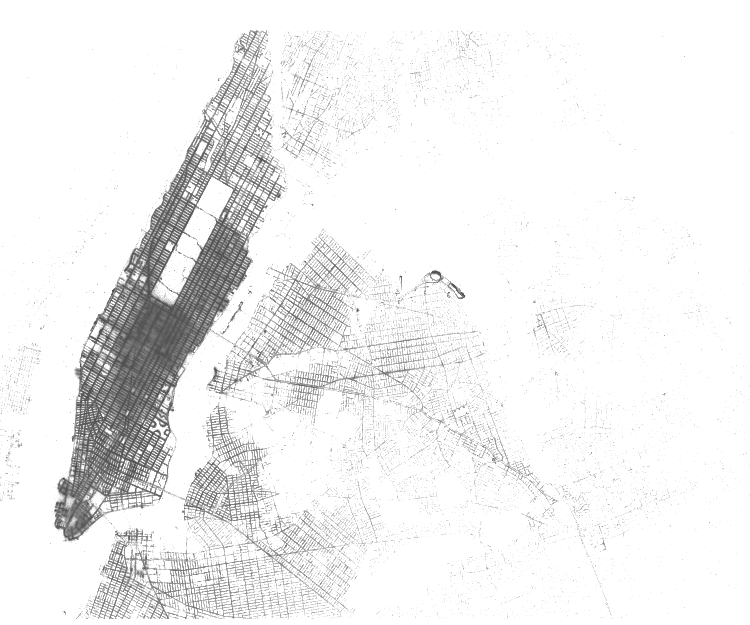

In [17]:
tf.shade(agg, cmap=Greys9_r, how='eq_hist')

The histogram is now fully flat (apart from the spacing of bins caused by the discrete nature of integer counting). Effectively, the visualization now shows a rank-order or percentile distribution of the data.  I.e., pixels are now colored according to where their corresponding counts fall in the distribution of all counts, with one end of the color range for the lowest counts, one end for the highest ones, and every colormap step in between having similar numbers of counts.  Such a visualization preserves the ordering between count values, faithfully displaying local differences in these counts, but discards absolute magnitudes (as the top 1% of the color range will be used for the top 1% of the data values, whatever those may be).

Now that the data is visible at every level, we can immediately see that there are some clear problems with the quality of the data -- there is a surprising number of trips that claim to drop off in the water or in the roadless areas of Central park, as well as in the middle of most of the tallest buildings in central Manhattan. These locations are likely to be GPS errors being made visible, perhaps partly because of poor GPS performance in between the tallest buildings.

Histogram equalization does not require any magic parameters, and in theory it should convey the maximum information available about the relative values between pixels, by mapping each of the observed ranges of values into visibly discriminable colors.  And it's clearly a good start in practice, because it shows both low values (avoiding undersaturation) and relatively high values clearly, without arbitrary settings.  

Even so, the results will depend on the nonlinearities of your visual system, your specific display device, and any automatic compensation or calibration being applied to your display device.  Thus in practice, the resulting range of colors may not map directly into a linearly perceivable range for your particular setup, and so you may want to further adjust the values to more accurately reflect the underlying structure, by adding additional calibration or compensation steps.

Moreover, at this point you can now bring in your human-centered goals for the visualization -- once the overall structure has been clearly revealed, you can select specific aspects of the data to highlight or bring out, based on your own questions about the data.  These questions can be expressed at whatever level of the pipeline is most appropriate, as shown in the examples below.  For instance, histogram equalization was done on the counts in the aggregate array, because if we waited until the image had been created, we would have been working with data truncated to the 256 color levels available per channel in most display devices, greatly reducing precision.  Or you may want to focus specifically on the highest peaks (as shown below), which again should be done at the aggregate level so that you can use the full color range of your display device to represent the narrow range of data that you are interested in.  Throughout, the goal is to map from the data of interest into the visible, clearly perceptible range available on your display device.


## 10-million-point datashaded plots: interactive

Although the above plots reveal the entire dataset at once, the full power of datashading requires an interactive plot, because a big dataset will usually have structure at very many different levels (such as different geographic regions).  Datashading allows auto-ranging and other automatic operations to be recomputed dynamically for the specific selected viewport, automatically revealing local structure that may not be visible from a global view.  We'll continue to use the [hvplot](https://hvplot.holoviz.org/) library to embed the generated images into a Bokeh plot to support fully interactive zooming. This is because with hvplot, you can access all the high level functionalities of datashader without having to write many lines of code:

In [18]:
import colorcet as cc

df.hvplot.points('dropoff_x', 'dropoff_y', rasterize=True, dynspread=True, aggregator=ds.sum('passenger_count'),
                 cnorm='eq_hist', cmap=cc.fire[100:], xaxis=None, yaxis=None, width=900, height=500, bgcolor='black')

:DynamicMap   []
   :Image   [dropoff_x,dropoff_y]   (dropoff_x_dropoff_y passenger_count)

When you zoom in interactively to this plot, you can see all the points available in that viewport without ever needing to change the plot parameters for that specific zoom level. We called `hvPlot` with 3 parameters that enable and control the interactive Datashader pipeline orchestrated by HoloViews:

- `rasterize=True` is truly the only argument required to enable rasterization with Datashader. In this mode, a new 2D array is computed on every zoom and pan event on the plot, making use of all the points available in the viewport. By default, every array cell counts the number of data points falling into that pixel. This 2D array is then colormapped client-side by Bokeh (in your browser in Javascript, not in Python) applying the histogram equalization scheme we have already covered.
- With `aggregator=ds.sum('passenger_count')`, we configured the aggregation step of the pipeline to deviate from the default count of data points per pixel. Instead, it computes the total number of passengers per pixel. You can remove the specified `aggregator` if you prefer the default trip counts.
- We've also set the optional `dynspread` parameter to `True` to automatically enlarge the size of each data point once you've zoomed in so far that data points no longer have nearby neighbors.

Check this page out to learn more about the [principles of Datashading](https://holoviews.org/user_guide/Large_Data.html#principles-of-datashading).

Note that if you are viewing this plot as a static HTML exported web page, zooming in will just make the pixels larger; you need the full running Python process to have it re-rendered interactively.

## Customizing datashader

One of the most important features of datashading is that each of the stages of the datashader pipeline can be modified or replaced, either for personal preferences or to highlight specific aspects of the data. However, this requires using the low-level Holoviews API instead of the hvplot API we have been using so far.

The above plots each followed a roughly standard series of steps useful for many datasets, but you can instead fully customize the computations involved. Here we'll use a custom transform function to only plot hotspots (defined here as pixels (aggregation bins) that are in the 90th percentile by count): 

In [19]:
import holoviews.operation.datashader as hd
from holoviews.element.tiles import EsriStreet

In [20]:
def transform(img):
    agg = img.data["dropoff_x_dropoff_y Count"]
    return img.clone(agg.where(agg>np.percentile(agg, 90)))

custom_points = hv.Points(df, ['dropoff_x', 'dropoff_y'])
custom_rasterized = hd.rasterize(custom_points).apply(transform).opts(cmap='fire', cnorm='eq_hist', tools=['hover'])
tiles = EsriStreet().redim.range(x=x_range, y=y_range).opts(alpha=0.5)

tiles * hd.dynspread(custom_rasterized, threshold=0.3, max_px=4)

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [dropoff_x,dropoff_y]   (dropoff_x_dropoff_y Count)

If you zoom in to the plot above, you can see that the 90th-percentile criterion at first highlights the most active areas in the entire dataset, and then highlights the most active areas in each subsequent viewport.  Here yellow has been chosen to highlight the strongest peaks, and if you zoom in on one of those peaks you can see the most active areas in that particular geographic region, according to this dynamically evaluated definition of "most active". 

To construct this plot, we need to understand the Xarray data structure returned by a call to `rasterize`:

In [21]:
img = hd.rasterize(custom_points, dynamic=False)
img.data

<xarray.Dataset>
Dimensions:                    (dropoff_x: 400, dropoff_y: 400)
Coordinates:
  * dropoff_x                  (dropoff_x) float64 -8.254e+06 ... -8.21e+06
  * dropoff_y                  (dropoff_y) float64 4.965e+06 ... 4.989e+06
Data variables:
    dropoff_x_dropoff_y Count  (dropoff_y, dropoff_x) uint32 0 0 0 0 ... 0 0 0 0

The `transform` function above first selects the indicated Data variable, then selects the pixels by percentile, and then returns the transformed image.

This capability lets you do novel operations on the data once it has been aggregated into pixel-shaped bins.  For instance, you might want to plot all the pixels where there were more dropoffs than pickups in blue, and all those where there were more pickups than dropoffs in red.  To do this, write your own transform function that can be applied to the rasterized (aggregated) pick up and drop off data to generate an interactive Bokeh plot:

In [22]:
def transform(overlay):
    picks = overlay.get(0).redim(pickup_x='x', pickup_y='y')
    drops = overlay.get(1).redim(dropoff_x='x', dropoff_y='y')
    pick_agg = picks.data["pickup_x_pickup_y Count"].data
    drop_agg = drops.data["dropoff_x_dropoff_y Count"].data
    more_picks = picks.clone(picks.data.where(pick_agg>drop_agg))
    more_drops = drops.clone(drops.data.where(drop_agg>pick_agg))
    return (hd.shade(more_drops, cmap=['lightcyan', "blue"]) *
            hd.shade(more_picks, cmap=['mistyrose', "red"]))

picks = hv.Points(df, ['pickup_x',  'pickup_y'])
drops = hv.Points(df, ['dropoff_x', 'dropoff_y'])
((hd.rasterize(picks) * hd.rasterize(drops))).apply(transform).opts(
    bgcolor='grey', xaxis=None, yaxis=None, width=900, height=500)

:DynamicMap   []
   :Overlay
      .RGB.I  :RGB   [x,y]   (R,G,B,A)
      .RGB.II :RGB   [x,y]   (R,G,B,A)

Now you can see that pickups are more common on major roads, as you'd expect, and dropoffs are more common on side streets.  In Manhattan, roads running along the island are more common for pickups. If you zoom in to any location, the data will be re-aggregated to the new resolution automatically, again calculating for each newly defined pixel whether pickups or dropoffs were more likely in that pixel. The interactive features of Bokeh are now fully usable with this large dataset, allowing you to uncover new structure at every level. 

We can also use other columns in the dataset as additional dimensions in the plot.  For instance, if we want to see if certain areas are more likely to have pickups at certain hours (e.g. areas with bars and restaurants might have pickups in the evening, while apartment buildings may have pickups in the morning).  One way to do this is to use the hour of the day as a category, and then colorize each hour:

In [23]:
colormap = cc.CET_C7s
num_hours = 24
indices = np.linspace(0, len(colormap) - 1, num_hours, dtype=int)
colors = [colormap[i] for i in indices]

In [24]:
pickups = hv.Points(df, ['pickup_x', 'pickup_y'])
shade =  hd.datashade(pickups, aggregator=ds.by('pickup_hour'), color_key=colors)
hd.dynspread(shade, threshold=0.3, max_px=4).opts(bgcolor='black', xaxis=None, yaxis=None, width=900, height=500)

:DynamicMap   []
   :RGB   [pickup_x,pickup_y]   (R,G,B,A)

In [25]:
pickups = hv.Points(df, ['dropoff_x', 'dropoff_y'])
shade = hd.datashade(pickups, aggregator=ds.by('pickup_hour'), color_key=colors)
hd.dynspread(shade, threshold=0.3, max_px=4).opts(bgcolor='black', xaxis=None, yaxis=None, width=900, height=500)

:DynamicMap   []
   :RGB   [dropoff_x,dropoff_y]   (R,G,B,A)

Here the order of colors is roughly green (midnight), lemon (4am), light orange (8am), soft magenta (noon), soft blue (4pm), lime green (8pm), and back to green (since hours and colors are both cyclic). There are clearly hotspots by hour that can now be investigated, and perhaps compared with an underlying map data.  And you can try first filtering the dataframe to only have weekdays or weekends, or only during certain public events, etc., or filtering the resulting pixels to have only those in a certain range of interest.  The system is very flexible, and it should be straightforward to express a very large range of possible queries and visualizations with very little code.

The above examples each used pre-existing components provided for the datashader pipeline, but you can implement any components you like and substitute them, allowing you to easily explore and highlight specific aspects of your data. Have fun datashading!